<div style="border:solid Chocolate 2px; padding: 40px">

<b>Мария, приветствую!</b>

Буду рада с тобой познакомиться. Меня зовут Евгения Маракова и я буду ревьюером твоего проекта. Если ты не против, то предлагаю общаться на "ты":) Если удобнее на "вы", то нет проблем, только скажи об этом.

В процессе работы ты встретишь комментарии <font color='green'>зеленого</font>, <font color='gold'>желтого</font> и <font color='red'>красного</font> цветов. Что они значат, смотри ниже:
    <br/>

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

<br/>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Решение на этом шаге станет еще лучше, если внести небольшие коррективы.
</div>


<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Решение на этом шаге требует существенной переработки и внесения правок. Напоминаю, что проект не может быть принят с первого раза, если ревью содержит комментарии, рекомендующие доработать шаги.
</div>
    
Увидев мой комментарий, не удаляй его, он будет очень полезен в случае повторной проверки работы😊
    
Свой комментарий помечай так, как показано ниже, тогда нам будет легче вести диалог, а мне выполнить повторную проверку проекта.
    <div class="alert alert-info"> <b>Комментарий студента: </b> </div>
    


# Проектная работа "Рынок заведений общественного питания Москвы"

In [1]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go 
import plotly.express as px
import json
import requests

import folium
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster

**Описание исследования**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены

**Цель исследования**

Целью исследования является подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Задачи исследования**

Обработать данные и ответить на поставленные вопросы\
Дать рекомендации по открытию кофейни

### Шаг 1. Загрузите данные и изучите общую информацию

In [2]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# игнорируем предупреждения
pd.set_option('chained_assignment', None)

# выставляем ограничение на показ знаков после запятой
pd.options.display.float_format = '{:,.2f}'.format

# устанавливаем стиль графиков
sns.set_style('whitegrid')
sns.set(rc={"figure.dpi":200, 'savefig.dpi':300})
sns.set_context('notebook')  
sns.set_style("ticks")

Загружаем данные

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


Посмотрим на то, какие заведения представлены

In [6]:
display(data['category'].unique())

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, ты отлично познакомилась с данными!
</div>

### Шаг 2. Выполните предобработку данных

Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [7]:
data.duplicated().sum()

0

Явных дубликатов нет. Ищем неявные дубликаты

In [8]:
data.duplicated(['name','category','address'],keep=False).sum()

0

In [9]:
data.duplicated(['name', 'address'],keep=False).sum()

0

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер, что поработала и с явными и неявными дублями!
</div>

Посмотрим, есть ли пропуски в данных

In [10]:
x = data['name'].count()
print('Количество данных:', x)

Количество данных: 8406


In [11]:
data.isna().mean().sort_values(ascending = False)

middle_coffee_cup   0.94
middle_avg_bill     0.63
price               0.61
avg_bill            0.55
seats               0.43
hours               0.06
name                0.00
category            0.00
address             0.00
district            0.00
lat                 0.00
lng                 0.00
rating              0.00
chain               0.00
dtype: float64

Больше всего пропусков в средней цене чашки кофе, чаке и категории цен в заведении

In [12]:
qwe = data.query('chain > 0')
qwe.isna().sum().sort_values(ascending = False)

middle_coffee_cup    2942
price                2068
middle_avg_bill      2019
avg_bill             1740
seats                1278
hours                 116
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Я так понимаю, что пропуски ты решила оставить. И это верное решение, так как заполнение или удаление пропущенных значений исказит результаты исследования.
</div>

Найдем, какие заведения встречаются чаще всего

In [13]:
data['name'].value_counts().head(10)

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Яндекс Лавка         69
Cofix                65
Prime                50
Хинкальная           44
Шаурма               43
Name: name, dtype: int64

Добавим улицы

In [14]:
data['street'] = data['address'].str.split(', ').str[1]
data.sample()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
639,Восточная кухня,кафе,"Москва, Волоколамское шоссе, 116, стр. 1",Северо-Западный административный округ,NaN,55.83,37.41,3.70,NaN,NaN,NaN,NaN,1,320.00,Волоколамское шоссе


Узнаем, работает ли заведение круглосуточно или же нет

In [15]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [16]:
data.sample(8)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3302,Cinnabon,кофейня,"Москва, Малая Филёвская улица, 22",Западный административный округ,"ежедневно, 10:00–22:00",55.74,37.47,3.90,NaN,NaN,NaN,NaN,1,NaN,Малая Филёвская улица,False
5716,Milk&Beans,кофейня,"Москва, Мичуринский проспект, 5",Западный административный округ,"ежедневно, 08:00–22:00",55.70,37.51,4.40,средние,Цена чашки капучино:200–250 ₽,NaN,225.00,1,38.00,Мичуринский проспект,False
4780,Cafe13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.76,37.63,4.30,NaN,NaN,NaN,NaN,0,200.00,Мясницкая улица,False
3858,Актер,кофейня,"Москва, Страстной бульвар, 10",Центральный административный округ,пн-пт 11:00–22:00,55.77,37.61,4.20,NaN,NaN,NaN,NaN,0,NaN,Страстной бульвар,False
7155,Рест-кейтеринг,ресторан,"Москва, Варшавское шоссе, 46",Южный административный округ,пн-сб 09:00–21:00,55.67,37.63,4.90,NaN,NaN,NaN,NaN,0,NaN,Варшавское шоссе,False
2953,Столовая ДОКки № 9,столовая,"Москва, Кирпичная улица, 48",Восточный административный округ,пн-пт 11:30–14:30,55.78,37.74,2.50,NaN,NaN,NaN,NaN,0,NaN,Кирпичная улица,False
3438,Хачапури,кафе,"Москва, Большой Гнездниковский переулок, 10",Центральный административный округ,пн-чт 10:00–23:00; пт 10:00–00:00; сб 11:00–00:00; вс 11:00–23:00,55.76,37.61,4.70,выше среднего,NaN,NaN,NaN,1,76.00,Большой Гнездниковский переулок,False
3509,Кофемания,кофейня,"Москва, Кудринская площадь, 46/54с1",Центральный административный округ,"ежедневно, круглосуточно",55.76,37.59,4.40,высокие,Средний счёт:1500–2500 ₽,"2,000.00",NaN,1,NaN,Кудринская площадь,True


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Столбцы добавлены корректно!
</div>

Заменим значения, чтобы определить сетевое или несетевой заведение

In [17]:
data['chain'] = data['chain'].replace(1, "Сетевое")
data['chain'] = data['chain'].replace(0, "НеСетевое")

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошая идея!
</div>

### Шаг 3. Анализ данных

#### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее

Считаем, сколько заведений представлено

In [18]:
types_object = pd.pivot_table(data, values='name', index='category', aggfunc='count')
types_object['part'] = types_object['name'] / sum(types_object['name'])*100
types_object = types_object.sort_values(
    by = 'part', ascending = False)
types_object

,name,part
category,,
кафе,2378,28.29
ресторан,2043,24.30
кофейня,1413,16.81
"бар,паб",765,9.10
пиццерия,633,7.53
быстрое питание,603,7.17
столовая,315,3.75
булочная,256,3.05


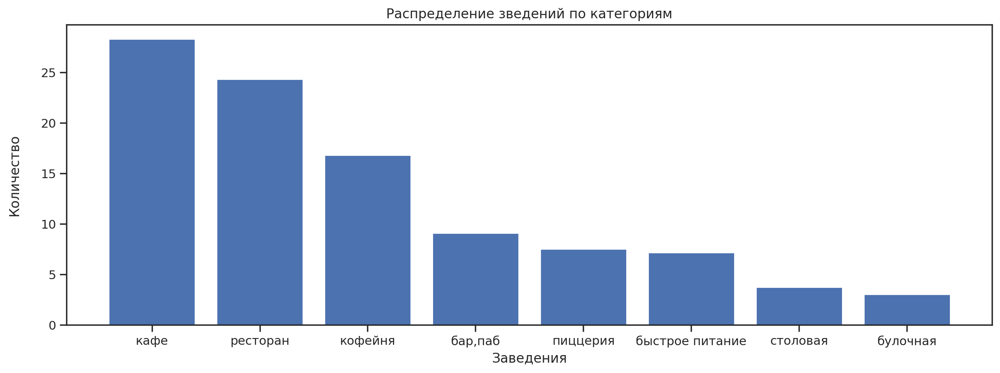

In [19]:
plt.figure(figsize=(15,5))
plt.title('Распределение зведений по категориям')
plt.xlabel('Заведения')
plt.ylabel('Количество\n')
plt.bar(x=types_object.index,height=types_object['part']);

Больше всего заведений представлено кафе, ресторанами и кофейнями

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Задание рассмотрено верно!
</div>

#### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [20]:
seats_data = data.groupby(by='category').agg({'seats':'median'}).sort_values(by='seats',ascending=False)
seats_data  

,seats
category,
ресторан,86.00
"бар,паб",82.50
кофейня,80.00
столовая,75.50
быстрое питание,65.00
кафе,60.00
пиццерия,55.00
булочная,50.00


Больше всего мест по медианному значению у заведений типа ресторан, бар, кофейня. А вот в пиццерии и булочной - мест меньше всего, что объясняется спецификой заведения

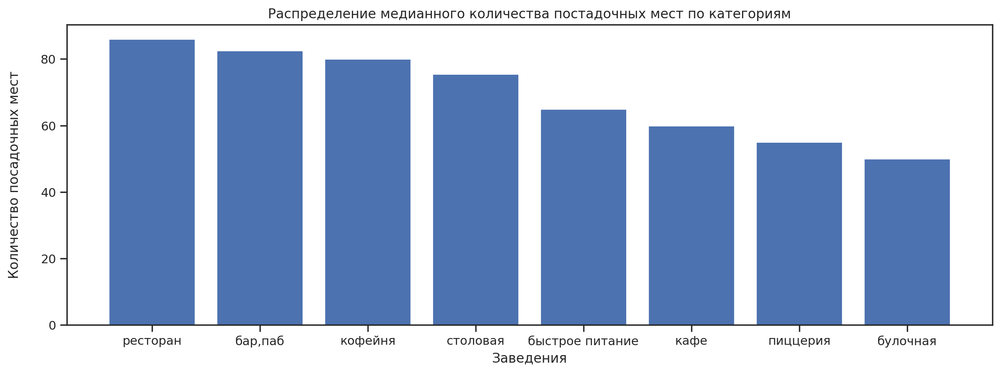

In [21]:
plt.figure(figsize=(15,5))
plt.title('Распределение медианного количества постадочных мест по категориям')
plt.xlabel('Заведения')
plt.ylabel('Количество посадочных мест\n')
plt.bar(x=seats_data.index,height=seats_data['seats']);

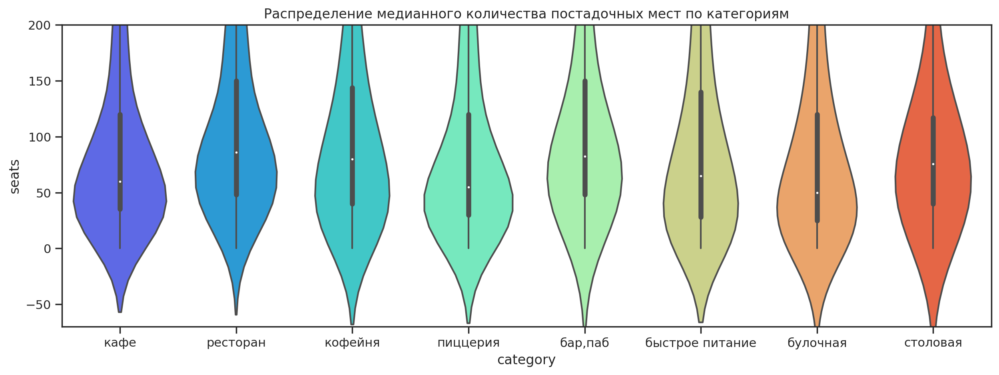

In [22]:
plt.figure(figsize=(15,5))
plt.title('Распределение медианного количества постадочных мест по категориям')
plt.xlabel('Заведения')
plt.ylabel('Количество посадочных мест\n')
ax = sns.violinplot(x='category', y='seats', data=data, palette='rainbow')
ax.set_ylim([-70, 200]);

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
У визуализаций не забываем подписывать название.

<div class="alert alert-info"> <b>Комментарий студента: </b> Добавила </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Красота!
</div>

Можно заметить, что медианное значения по количеству места ниже в кафе, пиццерии и булочной. А вот медианное количество посадочных мест в ресторане, баре и столовой - выше.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Умница, что рассмотрела задание по медиане, в данных имеются приличные выбросы!
</div>

#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [23]:
data_chain = data.groupby(by='chain').agg({'chain':'count'}).rename(columns={'chain':'amount'})
data_chain['percent'] = round(data_chain['amount']/data['chain'].count(),2)
data_chain

,amount,percent
chain,,
НеСетевое,5201,0.62
Сетевое,3205,0.38


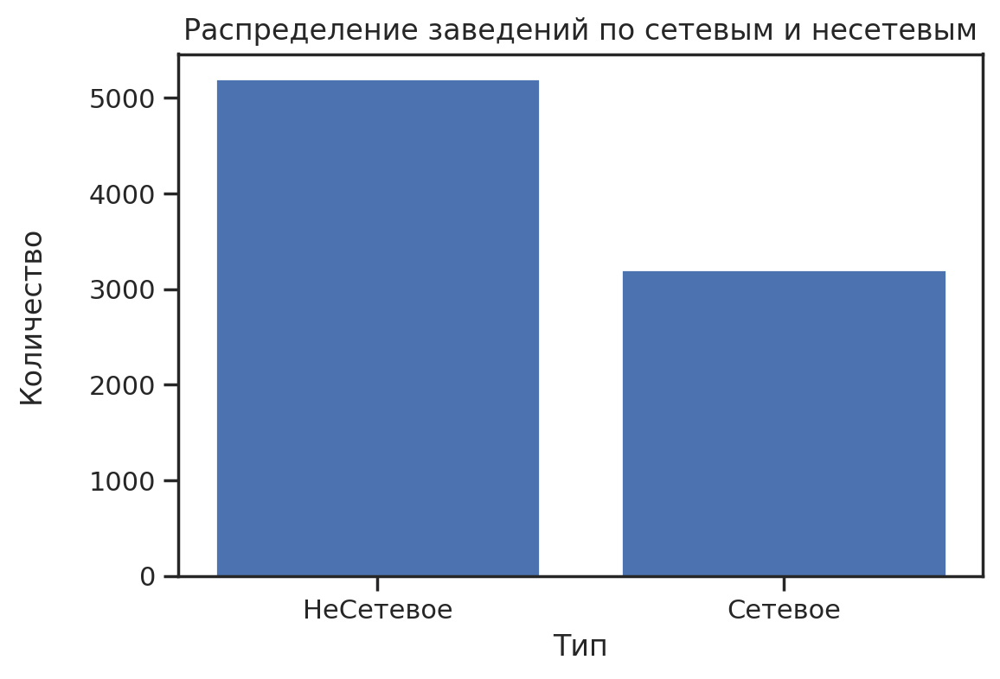

In [24]:
plt.title('Распределение заведений по сетевым и несетевым')
plt.xlabel('Тип')
plt.ylabel('Количество\n')
plt.bar(x=data_chain.index,height=data_chain['amount']);

Несетевых заведений больше,чем сетевых

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Совершенно верно!
</div>

In [25]:
fig = go.Figure(data=[go.Pie(labels=data_chain.index, values=data_chain['amount'])],\
                layout=go.Layout(title=go.layout.Title(text="Распределение заведений по сетевым и несетевым")))
fig.show() 

Причем процентное соотношение показывает, насколько более лидирующую позицию занимают несетевые заведения - их доля почти 62%!

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо! Круговая диаграмма для данного параметра лучше подходит:)
</div>

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [26]:
chain = data.groupby(by='chain').agg({'category':'count'}).rename(columns={'category':'amount'})\
                                        .sort_values(by='amount',ascending=False)

chain

,amount
chain,
НеСетевое,5201
Сетевое,3205


In [27]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,НеСетевое,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,НеСетевое,4.00,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,НеСетевое,45.00,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,НеСетевое,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,Сетевое,148.00,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,НеСетевое,86.00,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.64,37.66,4.80,NaN,NaN,NaN,NaN,НеСетевое,150.00,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,3.90,NaN,Средний счёт:от 150 ₽,150.00,NaN,НеСетевое,150.00,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,4.20,NaN,NaN,NaN,NaN,Сетевое,150.00,Люблинская улица,True


In [28]:
category = data.pivot_table(index = 'chain', columns = 'category', values = 'seats', aggfunc = 'count')
category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
chain,,,,,,,,
НеСетевое,357,55,219,789,342,179,807,120
Сетевое,111,93,130,429,409,248,463,44


Чаще всего среди сетевых заведений встречаются - кафе, рестораны и кофейни. Чуть реже - пиццерии и быстрое питание

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Если рассматривать по абсолютному показателю, то верно! Логично, что чаще бывают сетевыми кафе, рестораны и кофейни, так как они, в принципе, преобладают по количеству в датасете:)
</div>

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
У нас спрашивается: "Какие заведения чаще всего бывают сетевыми?". То есть нужно найти категории сетевых заведений, которые преобладают из всех сетевых, относительно общей выборки. Рекомендую построить график с накоплением, где отобразишь и сети и несети для каждой категории. Тогда сразу увидишь, в каких категориях преобладают именно сетевые заведения.

<div class="alert alert-info"> <b>Комментарий студента: </b> Добавила </div>

<Figure size 3000x1000 with 0 Axes>

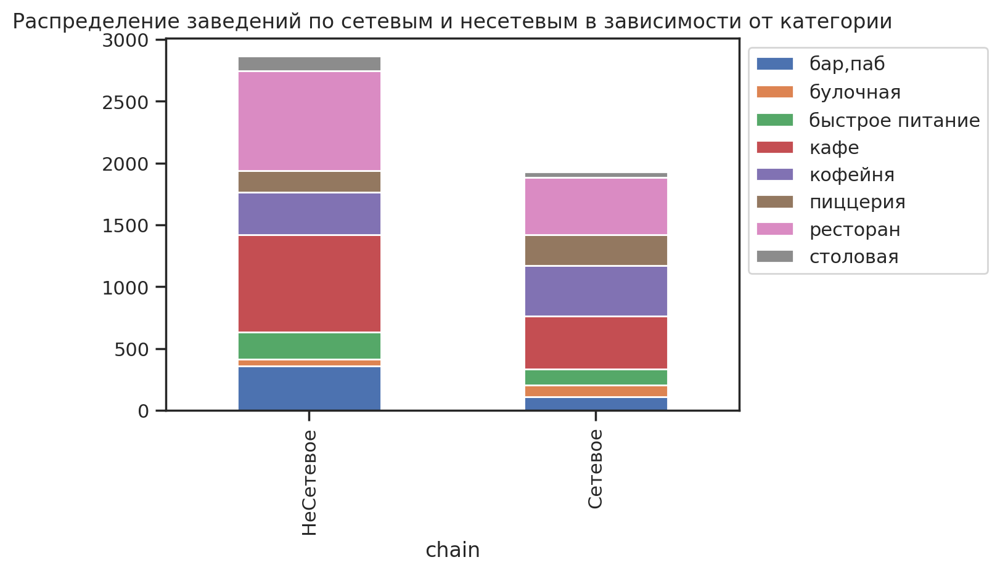

In [29]:
plt.figure(figsize=(15,5))
category.plot(kind='bar', stacked= True)
plt.title('Распределение заведений по сетевым и несетевым в зависимости от категории')
plt.legend(bbox_to_anchor=(1,1), loc='upper left');

Чаще всего сетевыми заведениями являются рестораны, кафе и кофейни. Причем кофеен среди сетевых заведений даже больше, чем среди несетевых. Видимо, сетевые кофейни имеют спрос в Москве!

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Вооот, кофейни увидела! Также среди сетей преобладают пиццерии и булочные:)
</div>

#### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

<div class="alert alert-info"> <b>Комментарий студента: </b> Отфильтровала тут по chain </div>

In [30]:
top15 = data.query('chain == "Сетевое"').groupby(by='name').agg({'name':'count'}).rename(columns={'name':'amount'})\
                                        .sort_values(by='amount',ascending=False).head(15)

top15

,amount
name,
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Яндекс Лавка,69
Cofix,65
Prime,50
Хинкальная,44
КОФЕПОРТ,42


In [58]:
fig1 = px.bar(top15, x=top15.index, y='amount')
fig1.update_layout(title='Самые популярные сетевые заведения',xaxis_title='Название',yaxis_title='Количество заведений')
fig1.update_xaxes(tickangle=30) # повернём подписи по оси X на 45 градусов
fig1.show()

Большинство заведений мне знакомо. В основном это сетевые заведения, которые популярны в Москве и есть практически в любом районе. Их объединяет признак - относительно недорогая продукция и близость к популярным местам, где большое скопление людей

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Для того, чтобы проанализировать СЕТИ, необходимо при группировке фильтровать по chain.

<div class="alert alert-info"> <b>Комментарий студента: </b> исправила </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Умничка!
</div>

#### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [32]:
district = data.groupby(by=['district','category']).agg({'category':'count'}).rename(columns={'category':'amount'})
district.reset_index(inplace= True)
district['sum'] = district['amount'].sum()
district['part'] = district['amount'] / district['sum']*100
display(district['district'].unique())
district.sort_values(by = 'part', ascending = False).head(10)

array(['Восточный административный округ',
       'Западный административный округ',
       'Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], dtype=object)

,district,category,amount,sum,part
46,Центральный административный округ,ресторан,670,8406,7.97
43,Центральный административный округ,кафе,464,8406,5.52
44,Центральный административный округ,кофейня,428,8406,5.09
40,Центральный административный округ,"бар,паб",364,8406,4.33
51,Юго-Восточный административный округ,кафе,282,8406,3.35
3,Восточный административный округ,кафе,272,8406,3.24
27,Северо-Восточный административный округ,кафе,269,8406,3.20
67,Южный административный округ,кафе,264,8406,3.14
11,Западный административный округ,кафе,239,8406,2.84
59,Юго-Западный административный округ,кафе,238,8406,2.83


В данных присутсвуеют следующие районы:

1) Восточный административный округ\
2) Западный административный округ\
3) Северный административный округ\
4) Северо-Восточный административный округ\
5) Северо-Западный административный округ\
6) Центральный административный округ\
7) Юго-Восточный административный округ\
8) Юго-Западный административный округ\
9) Южный административный округ

In [33]:
fig2 = px.sunburst(
    district,
    path=['district','category'],
    values='amount',title="Распределение заведений по округам",
    width=900, height=900
)
fig2.update_traces(textinfo="label+percent parent+value")
fig2.show()


Лидирует Центральный административный округ - в нем наибольшая доля заведений. А вот наименее популярным районом для заведений является Северо-Западный административный округ. Во всех районах, за исключением Центрального, лидирует кафе. А в Центральном лидируют рестораны

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [34]:
rating = data.groupby(by='category').agg({'rating':'mean'}).sort_values(by='rating',ascending=False)
rating

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


Наиболее высокий средний рейтинг имеют бары, пиццерии и рестораны. А вот наименее высокие средние оценки приходятся на кафе и быстрое питание - возможно там больше недовольных посетителей, которые могут ставить низкие оценки

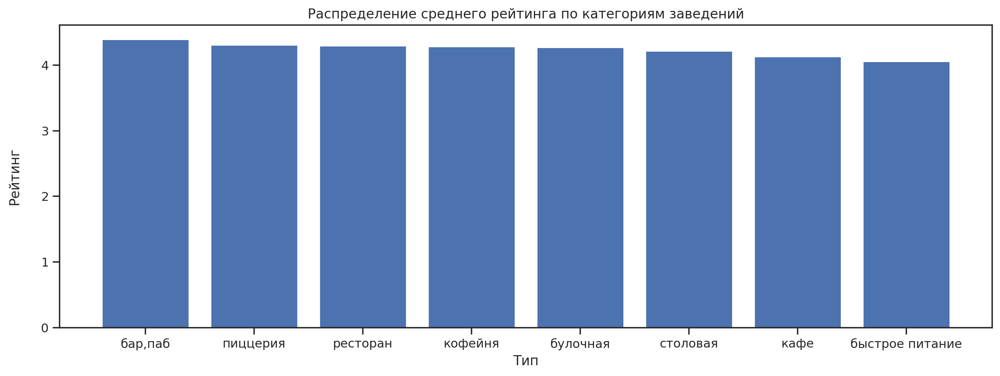

In [35]:
plt.figure(figsize=(15,5))
plt.title('Распределение среднего рейтинга по категориям заведений')
plt.xlabel('Тип')
plt.ylabel('Рейтинг\n')
plt.bar(x=rating.index,height=rating['rating']);

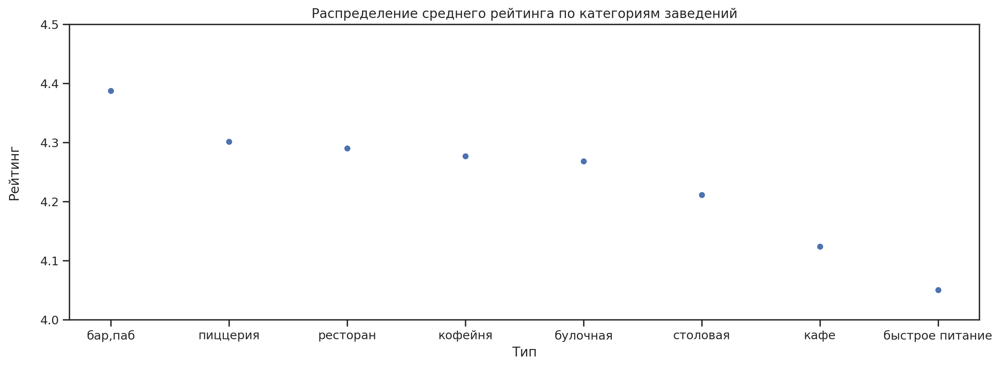

In [36]:
plt.figure(figsize=(15,5))
plt.title('Распределение среднего рейтинга по категориям заведений')
plt.xlabel('Тип')
plt.ylabel('Рейтинг\n')
rat = sns.scatterplot(data=rating, x=rating.index, y='rating')
rat.set_ylim([4, 4.5]);

<AxesSubplot:title={'center':'Распределение среднего рейтинга по категориям заведений'}, xlabel='category', ylabel='rating'>

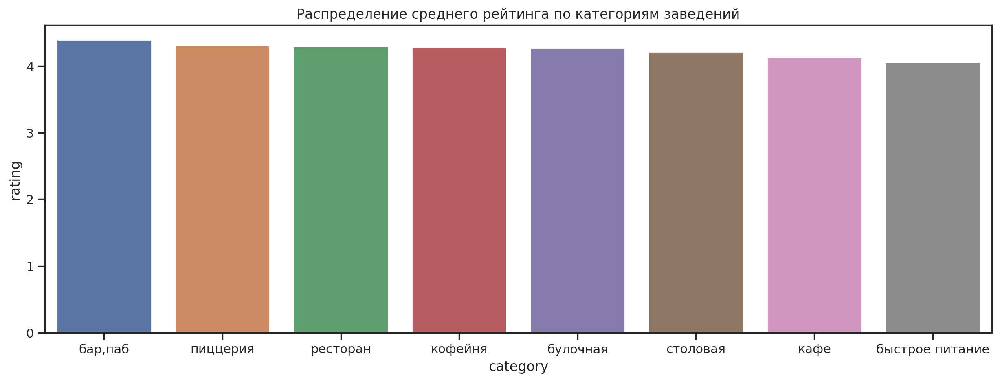

In [37]:
plt.figure(figsize=(15,5))
plt.title('Распределение среднего рейтинга по категориям заведений')
plt.xlabel('Тип')
plt.ylabel('Рейтинг\n')
sns.barplot(data=rating, x=rating.index, y='rating')

Выше всего средняя оценка у баров, а самая низкая - у быстрого питания.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Прекрасно!
</div>

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [38]:
d_rating = data.groupby(by='district').agg({'rating':'mean'})
d_rating.reset_index(inplace= True)
d_rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [39]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [40]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=d_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие среднии оценка ставят в центральном административного округе (4.37) , а наименьшие в Юго-Восточном (4.1). Видимо, в центре и сервис лучше и еда вкуснее... А может быть просто люди более довольные и меньше обращают внимание на недочеты и не ставят плохих оценок :) 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

#### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [41]:
marker_cluster = MarkerCluster().add_to(m)
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Карта добавлена корректно!
</div>

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [42]:
streets_15 = data.groupby(by='street').agg({'name':'count'}).sort_values(by='name',ascending=False).head(15)
streets_15

,name
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


In [43]:
streets_15 = data.groupby(by=['district','street','category']).agg({'name':'count'}).sort_values(by='name',ascending=False).head(15)
streets_15.reset_index(inplace= True)
streets_15

,district,street,category,name
0,Северо-Восточный административный округ,проспект Мира,кафе,41
1,Юго-Западный административный округ,Профсоюзная улица,кафе,35
2,Северо-Восточный административный округ,проспект Мира,ресторан,34
3,Западный административный округ,проспект Вернадского,ресторан,29
4,Юго-Восточный административный округ,Люблинская улица,кафе,26
5,Северный административный округ,Ленинградское шоссе,ресторан,26
6,Юго-Западный административный округ,Профсоюзная улица,ресторан,26
7,Юго-Восточный административный округ,МКАД,кафе,25
8,Северный административный округ,Ленинградский проспект,ресторан,25
9,Северный административный округ,Ленинградский проспект,кофейня,25


In [44]:
fig5 = px.sunburst(
    streets_15,
    path=['district','street','category'],
    values='name',title="Распределение заведений по округам и самым популярным улицам",
    width=950, height=850)
fig5.update_traces(textinfo="label+percent parent+value")
fig5.show()

Все заведения по Северо-Восточному округу находятся на Проспекте Мира, где на 9 км начиная от Сухаревской площади на Садовом кольце и заканчивается на Северянинском путепроводе, переходя в Ярославское шоссе расположились 41 кафе и 34 ресторана. Проигрывает же - Восточный округ, который беден заведениями - всего 15 кафе входят в топ.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо!
</div>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Тоже рекомендую добавить график для наглядности:)
        
</div>

#### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [45]:
street_1 = data.groupby(by=['street','category']).agg({'category':'count'}).rename(columns={'category':'amount'})\
                                                .sort_values(by='amount')
street_1.reset_index(inplace= True)
street_1.query('amount < 2')
street_1_1 = street_1.groupby(by='street').agg({'amount':'count'}).sort_values(by='amount')
street_1_1 = street_1_1.query('amount < 2')
street_1_1.reset_index(inplace= True)
street_1_2 = pd.merge(street_1, street_1_1, how ='inner', on ='street')
display(street_1_1.head(10))
street_1_2['category'].value_counts()

,street,amount
0,1-й Автозаводский проезд,1
1,Пестовский переулок,1
2,Петроверигский переулок,1
3,Петровско-Разумовская аллея,1
4,Платовская улица,1
5,Плотников переулок,1
6,Подольское шоссе,1
7,Пожарский переулок,1
8,Полоцкая улица,1
9,Померанцев переулок,1


кафе               198
ресторан           111
кофейня             90
бар,паб             43
столовая            41
быстрое питание     26
пиццерия            18
булочная            10
Name: category, dtype: int64

Несмотря на то, что на улице заведение всего одно, но чаще всего в нем можно полноценно поесть, ведь это кафе, ресторан или кофейня

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер!
</div>

#### Как удалённость от центра влияет на цены в заведениях?

In [55]:
dist_avg = data.groupby(by='district').agg({'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill',ascending=False)
dist_avg.reset_index(inplace= True)
dist_avg

,district,middle_avg_bill
0,Западный административный округ,"1,000.00"
1,Центральный административный округ,"1,000.00"
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


In [56]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_avg,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m1)

# выводим карту
m1

Дороже всего посещать заведения в центре и на Северо-западе. Там больше заведений, рассчитанных на более высокий чек. Это логично, потому что как минимум нужно отбивать высокую стоимость аренды. Плюс целевые группы покупателей имеют выше достаток и средний чек может расти из-за числа туристов, которые чаще весго посещают исторические места столицы.  

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
В данных имеются аномалии, стоит рассмотреть по медиане.

<div class="alert alert-info"> <b>Комментарий студента: </b> Рассмотрела по медиане </div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец!
</div>

#### Общий вывод

Высокое значение среднего чека заведения характерно для центра Москвы. 
Значение среднего чека зависит от района:
Самые дорогие округа: Центральный и Западный со средним чеком 1191 и 1053 соотвественно
Самые дешевые округа: Северо-Восточный и Юго-Восточный со средним чеком 716 и 654 соответсвенно
Но делать поспешные выводы о прибыльности заведений в центре - рано, так как неизвестно, какие затраты они несут.

В ходе исследования была выявлена популярность типов заведений общественного питания: 
1) кафе - 2377
2) ресторан - 2041
3) кофейня - 1413
4) пиццерия - 633
5) бар,паб - 765
6) быстрое питание - 603
7) булочная - 255
8) столовая - 315

Было проанализировано, где больше посадочных места - оказалось, чот в ресторанах, пабах, в кофейнях и столовых. Это связано с тем, что обычно в таких местах люди проводят достаточно много времени и нужны полноценные места. А вот в пиццериях и булочных посадочных мест гораздо меньше, что в приципе и хорошо - взял булку и пошёл! А многие сетевые пиццерии в основном работают на доставку.

Приобладающее большинство это Несетевые заведения.

Среди сетевых в топе - Шоколадница,Доминос Пицца и ДоДо пицца - то, что у всех на слуху.

Наибольшая концентрация заведений в Центральном административном округе (27%). Одинаковые 11% разделили Северный административный округ, Северо-Восточный административный округ, Южный административный округ.


Средняя оценка примерно равна 4,2. Есть над чем работать. Наивысшую оценку заслужили бары, а вот быстрое питание пришлось "не по вкусу".

Наивысшая средняя оценка характерна Для центрального административного округа (4.37) , наименьшая для Юго-Восточного (4.1).
Самой популярной улицей по количеству заведений является Проспект Мира (183 заведения). Возможно это связано с его протяженностью
Чаще всего на улицах с только одним заведением встречаются кафе и рестораны.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, что собрала все данные в общий вывод!
</div>

### Шаг 4. Детализируем исследование: открытие кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [48]:
coffe = data.query('category =="кофейня"')
coffe_d = coffe.groupby(by='district').agg({'name':'count'}).sort_values(by='name',ascending=False)
coffe_d

,name
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [49]:
fig5 = px.bar(coffe_d, x=coffe_d.index, y='name')
fig5.update_layout(title='Количество кофеен по округам',xaxis_title='Округ',yaxis_title='Количество заведений')
fig5.update_xaxes(tickangle=45) # повернём подписи по оси X на 45 градусов
fig5.show()

In [50]:
c = Map(location=[moscow_lat, moscow_lng], zoom_start=14
       )

marker_cluster_c = MarkerCluster().add_to(c)
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_c(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_c)
# применяем функцию create_clusters() к каждой строке датафрейма
coffe.apply(create_clusters_c, axis=1)

# выводим карту
c

Так как в исследование попали 1413 кофеен, большинство которых находится в центральном административном округе. На построенной карте отмечены кофейни на карте.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

#### Есть ли круглосуточные кофейни?

In [51]:
coffe['is_24_7'].sum()

59

Круглосуточные кофейни имеются

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Совершенно верно!
</div>

#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [52]:
coffe_r = coffe.groupby(by='district').agg({'rating':'mean'}).sort_values(by='rating',ascending=False)
display(round(coffe_r['rating'].mean(),2))
coffe_r

4.27

,rating
district,
Центральный административный округ,4.34
Северо-Западный административный округ,4.33
Северный административный округ,4.29
Юго-Западный административный округ,4.28
Восточный административный округ,4.28
Южный административный округ,4.23
Юго-Восточный административный округ,4.23
Северо-Восточный административный округ,4.22
Западный административный округ,4.20


In [53]:
fig6 = px.bar(coffe_r, x=coffe_r.index, y='rating')
fig6.update_layout(title='Средний рейтинг кофеен по округам',xaxis_title='Округ',yaxis_title='Рейтинг')
fig6.update_xaxes(tickangle=45) # повернём подписи по оси X на 45 градусов
fig6.show()

AttributeError: 'AxesSubplot' object has no attribute 'update_xaxes'

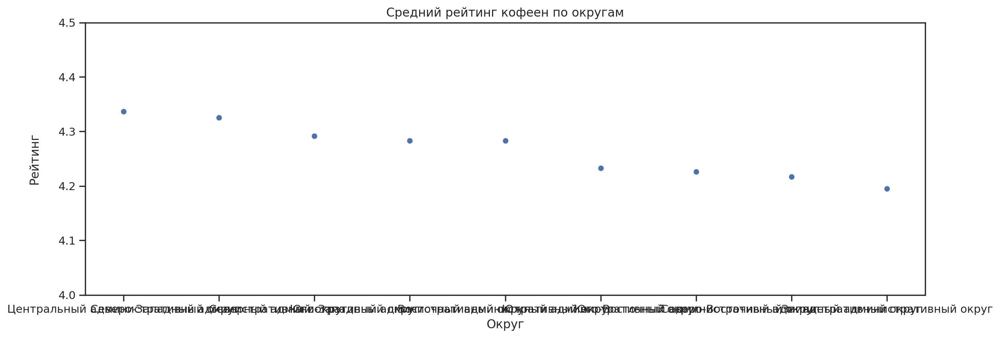

In [54]:
plt.figure(figsize=(15,5))
plt.title('Cредний рейтинг кофеен по округам')
plt.xlabel('Округ')
plt.ylabel('Рейтинг\n')
rat = sns.scatterplot(data=coffe_r, x=coffe_r.index, y='rating')
rat.set_ylim([4, 4.5])
rat.update_xaxes(tickangle=45);

Вопрос, а как тут сделать, чтобы не сливалось?

Средняя оценка кофеен равна 4.27. Так же можно отметить, что средний рейтинг кофеен незначительно меняется в зависимости от округа

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Согласна! В данном типе графика не могу подсказать, как сделать, чтобы округа не сливались. Попробуй обратиться к преподователю:)
</div>

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [ ]:
coffe_d_b = coffe.groupby(by='district').agg({'middle_coffee_cup':'mean'}).sort_values(by='middle_coffee_cup',ascending=False)
coffe_d_b

In [ ]:
fig7 = px.bar(coffe_d_b, x=coffe_d_b.index, y='middle_coffee_cup')
fig7.update_layout(title='Средняя стоиомость кофе по округам',xaxis_title='Округ',yaxis_title='Стоимость')
fig7.update_xaxes(tickangle=45) # повернём подписи по оси X на 45 градусов
fig7.show()

В зависимости от места открытия кофейни имеет смысл устанавливать разную цену. Чем ближе к центру, тем сильнее может быть увеличена цена и наоборот. Нужно учитывать эластичность спроса (то, как покупатели реагируют на изменение цены). В более людных местах или местах, где живут более обеспеченные люди, рост цены не вызовет диссонанса. А вот в более отдаленных уголках Москвы - колебания в 10-20 рублей будут существенным поводом для покупателей отказаться от предлагаемого кофе. Так, если открывать в Западном, Центральном или Юго-Западном округах, то можно ставить цену примерно на уровне 185 рублей. Если же открывать в Северо-Восточном, Южном или Юго-Восточном округах, то цена должна быть в районе 160 рублей за чашку. Данные цены должны быть конкурентоспособными

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

### Рекомендация по открытию кофейни

Открывать кофейню необходимо предварительно определив, кто является целевым покупателем и какую цену мы хотим установить. Немаловажно удачно выбрать место, чтобы оно было достаточно проходимым и рядом не было большого количества других кофеен, которые могли бы конкурировать с нашей. Маркетинговая составляющая тоже важна - чем ближе к центру, тем больше нужно уделять внимание стилю и подаче кофе и его индивидуальному бренду. Кофейня не требует большого числа посадочных мест, поэтому можно таким образом сэкономить на аренде и повысить прибыльность. Возможно, для открытия подойдет Юго-Западный округ в котором 96 кофеен, что меньше, чем в среднем по округам, так же для этого округа характерна одна из наиболее высоких средних цен на кофе, то есть 185 рублей за чашку.Можно также выбрать Восточный округ: 106 заведений и 171 рубль за чашку кофе.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Обоснованно!
</div>

Ссылка на презентацию https://disk.yandex.ru/d/tj-5M_gnpbOJzA

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Учти замечания и откорректируй презентацию.
        
</div>

<div style="border:solid Chocolate 2px; padding: 40px">
Маша, давай подведем итоги. Ты большая молодец, что старалась и проделала такую большую работу. Мне понравилось, что ты наполнила проект развернутыми выводами и наглядно продемонстрировала каждое задание:)
    
    Разберем над чем стоит поработать:

    1. Рассмотреть сети, относительно общей выборки.

    2. Чтобы вывести топ-15 сетей, необходимо при группировке фильтровать по chain.

    3. Составляя диаграммы, оценивай как бы они выглядели информативнее.

    4. Не забывай про подписи названий у графиков.

    
    Пересмотри работу и исправь ошибки. Обязательно пиши, если я могу тебе еще чем-то помочь. Удачи!)
  

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Маша, привет! Молодец, отлично откорректировала проект. Работа принята, хорошего дня:)
</div>